# Project 4 - Proximal Policy Optimization

###Import and install all necessary libraries and packages


In [2]:
!sudo apt-get update
!sudo apt-get install xvfb
!sudo apt-get install x11-utils
!pip -q install gym
!pip install pybullet
!pip3 install numpngw

Get:1 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:5 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:6 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]
Get:7 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:8 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:9 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:11 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [52.7 kB]
Ign:12 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:13 https://developer.download.nvid

In [3]:
"""ENVIRONMENT"""
import gym                                                                      #OpenAI gym 
import pybullet as pS
import pybullet_envs
gym.logger.set_level(40)                                                        #suppresses warning messages, displays only error messages

"""MODELS AND TOOLS FOR OPTIMIZATION AND OTHER COMPUTATIONS"""
import time
import numpy as np
import torch                                                                    #will use PyTorch to handle the NN 
import torch.nn as nn                                                           #contains various NN layers
import torch.distributions as pdf                                               #contains various distributions such as Normal and Categorical
import torch.nn.functional as F                                                 #includes various functions such as convolution etc.
import torch.optim as optim                                                     #contains various optimization algorithms
import random
from random import sample
from collections import deque

"""VISUALIZATION"""
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image
from numpngw import write_apng

"""I/O"""
import os
from pathlib import Path

### Some useful functions

In [4]:
from google.colab import drive
from google.colab import files

def save_checkpoint(model, filename, mode=0):
    """
    Save a model to a file in your colab space 
        
    Parameters
    ----------
    model: your policy network
    filename: the name of the checkpoint file
    mode (int): determines where to store the file
                --> 0: collab space 1: Google Drive
    """
    if mode == 1: 
      drive.mount('/content/gdrive')
      path = F"/content/gdrive/My Drive/{filename}" 
      torch.save(model.state_dict(), path)
    else:
      torch.save(model.state_dict(), filename)

def export_to_local_drive(filename):
    """
    Download a file to your local machine 
        
    Parameters
    ----------
    filename: the name of the file
    """
    files.download(filename)


### Q1. PPO with clipped objective and GAE

Implement below the Proximal Policy Optimization (PPO) algorithm using a clipped objective and generalized advantage estimatation (GAE) to solve the HopperBulletEnv-v0 enviroment. Please, refer to the project descriprtion and lecture 19 for more details. 

###Test the environment

In [5]:
"""TESTING"""
env=gym.make("HopperBulletEnv-v0")
images=[]
#env.seed(10)
s=env.reset()
img=env.render(mode='rgb_array')
images.append(img)
terminal=False
episodeReward=0
experiences=0
while not terminal:
  action=env.action_space.sample()
  experiences+=1
  s,r,terminal,info=env.step(action)
  episodeReward+=r
  img=env.render(mode='rgb_array')
  images.append(img)
  if experiences>60:
    break
env.close()
print('\nEpisode reward:'+str(episodeReward))


Episode reward:23.674883228506946


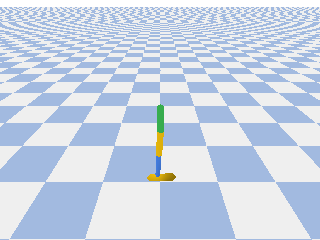

In [6]:
write_apng('anim.png',images,delay=20)
Image(filename='anim.png')

The observation consists of a vector with 15 continuous variables including the height of the agent's torso, the agent's global orientation in the forward direction, the angular velocity , the joint angles and linear speeds, roll and pitch information, and a Boolean that denotes the state of the foot (1 if the foot is in contact with the ground, 0 otherwise).

There are three continuous actions that denote the torques applied to the thigh, leg, and foot joints of the agent. *The expected range of each of the two actions is [-1, 1].* Please make sure that your policy network outputs values in that range.


In [7]:
print('observation space:',env.observation_space)
print('action space:',env.action_space)
print('solved_score',env.spec.reward_threshold)

observation space: Box(-inf, inf, (15,), float32)
action space: Box(-1.0, 1.0, (3,), float32)
solved_score 2500.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:146: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:169: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


Time elapsed(s): 34.48	#iterations: 0	#trajectories: 324	#time-steps: 5000	Mean evaluation reward: 30.53
Time elapsed(s): 68.97	#iterations: 1	#trajectories: 319	#time-steps: 10000	Mean evaluation reward: 32.29
Time elapsed(s): 102.49	#iterations: 2	#trajectories: 307	#time-steps: 15007	Mean evaluation reward: 36.23
Time elapsed(s): 132.54	#iterations: 3	#trajectories: 268	#time-steps: 20007	Mean evaluation reward: 37.90
Time elapsed(s): 162.07	#iterations: 4	#trajectories: 261	#time-steps: 25014	Mean evaluation reward: 40.79
Time elapsed(s): 190.15	#iterations: 5	#trajectories: 244	#time-steps: 30032	Mean evaluation reward: 52.21
Time elapsed(s): 216.10	#iterations: 6	#trajectories: 209	#time-steps: 35041	Mean evaluation reward: 90.86
Time elapsed(s): 240.42	#iterations: 7	#trajectories: 174	#time-steps: 40045	Mean evaluation reward: 94.51
Time elapsed(s): 262.65	#iterations: 8	#trajectories: 118	#time-steps: 45085	Mean evaluation reward: 109.61
Time elapsed(s): 284.90	#iterations: 9	

Text(0.5, 1.0, 'Mean #experiences v/s #Trajectories')

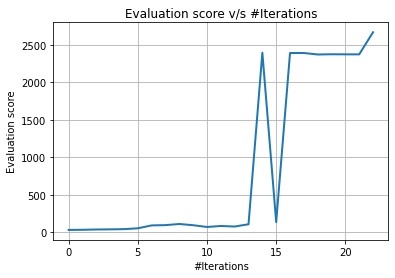

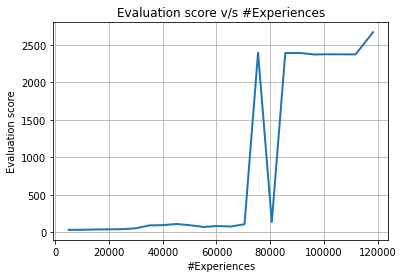

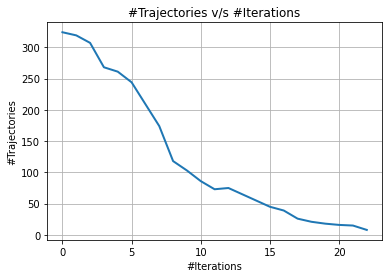

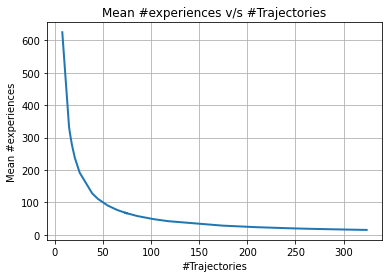

In [11]:
import time
tic=time.time()
"""SWITCH TO A GPU IF ONE IS AVAILABLE"""
device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")



"""DEFINITION OF THE ARCHITECTURE AND THE ATTRIBUTES OF THE POLICY (OR ACTOR) NETWORK"""
class Policy(nn.Module):                                                        
  def __init__(self,observations,actions,hu1,hu2,hu3):                          #define the network architecture - #hidden layers, #hidden units, and the layer types
    super(Policy,self).__init__()
    self.l1=nn.Linear(observations,hu1)                                         #layer1 is a fully-connected layer with #I/P=observations and #hidden units=hu1
    self.l2=nn.Linear(hu1,hu2)                                                  #layer2 is a fully-connected layer with #I/P=hu1 and #hidden units=hu2
    self.l3=nn.Linear(hu2,actions)                                              #layer3 is a fully-connected layer with #I/P=hu2 and #O/P units=actions

  def forward(self,x):                                                          #forward propagation function
    if not isinstance(x,torch.Tensor):                                          #check if the I/P is a tensor or not
      x=torch.tensor(x,device=device,dtype=torch.float32)                       #convert the I/P to a tensor and move it to 'device'
      x=x.unsqueeze(0)
    x=torch.tanh(self.l1(x))                                                    #activation functions of all three layers are tanh. Layer 3 uses tanh since all three O/Ps must lie in the range [-1,1]
    x=torch.tanh(self.l2(x))
    x=torch.tanh(self.l3(x))
    return x                                                                    #there are 3 O/P values at any time instant since there are three angles for the hyperbullet

  def selectDistribution(self,x,sigma):                                         #this function treats the O/Ps of 'forward( )' as the means of a multivariate PDF
    means=self.forward(x)                                                       #[μ1 μ2 μ3] of a multivariate PDF
    covariance=torch.diag(sigma**2).to(device)                                  #covariance is a 3X3 matrix with all elements in the leading diagonal=σ^2. All the remaining elements are equal to zeros
    return pdf.MultivariateNormal(means,covariance)                             #returns a multivariate Gaussian distribution with #variables=3 (same as #actions)

  def actGreedily(self,x):                                                      #returns greedy actions based on trained network to perform evaluation roll-outs
    return self.forward(x)                                                      #greedy action=[μ1 μ2 μ3] as the most-probable action values are the means. So, no need to sample actions from a distribution



"""DEFINITION OF THE ARCHITECTURE AND THE ATTRIBUTES OF THE VALUE-FUNCTION (OR CRITIC) NETWORK"""
class Value(nn.Module):
  def __init__(self,observations,hu1,hu2,hu3):                                  #define the network architecture - #hidden layers, #hidden units, and the layer types
    super(Value,self).__init__()
    self.l1=nn.Linear(observations,hu1)                                         #layer1 is a fully-connected layer with #I/P=observations and #hidden units=hu1
    self.l2=nn.Linear(hu1,1)                                                    #layer2 is a fully-connected layer with #I/P=hu1 and #O/P units=1 (since the value-function of any state is a scalar value)  

  def forward(self,x):                                                          #forward propagation function
    if not isinstance(x,torch.Tensor):                                          #check if the I/P is a tensor or not
      x=torch.tensor(x,device=device,dtype=torch.float32)                       #convert the I/P to a tensor and move it to 'device'
      x=x.unsqueeze(0)
    x=F.relu(self.l1(x))                                                        #activation functions of layers 1 and 2 are ReLU, layer 3 uses no activation as the value-function can be any real number
    x=self.l2(x)
    return x                                                                    #returns the value-function of the state represented by 'x'



"""DEFINITION OF THE CHARACTERISTICS AND ATTRIBUTES OF THE DQN AGENT"""
class PPOagent():
  def __init__(self,observations,actions,huP1,huP2,huP3,huV1,huV2,huV3,alphaP,
               alphaV):
    self.policynet=Policy(observations,actions,huP1,huP2,huP3).to(device)       #policy-network
    self.valuenet=Value(observations,huV1,huV2,huV3).to(device)                 #value-function NN
    self.policyOptimizer=optim.Adam(self.policynet.parameters(),lr=alphaP)      #optimizer to update the weights θ of the value-function NN
    self.valueOptimizer=optim.Adam(self.valuenet.parameters(),lr=alphaV)        #optimizer to update the weights φ of the value-function NN

  def train(self,env,seed,H,maxIterations,buffer,gamma,lamda,sigma,size,epochs,
            epsilon,entropyWeight,rewardThreshold):
    torch.manual_seed(seed) 
    np.random.seed(seed)
    random.seed(seed)
    results=[]                                                                  #saves the results for each iteration
    evalRewards=[]                                                              #stores all evaluation rewards
    self.numExperiences=0                                                       #keeps track of the total #experiences collected so far
    self.sigma=sigma
    self.D=deque(maxlen=buffer)                                                 #buffer 'D' from which the mini-batches that update the weights θ are sampled
    for iteration in range(maxIterations):                                      #run iterations until total #iterations exceeds 'maxIterationss'
      self.D.clear()                                                            #clear 'D' at the start of each iteration so that it contains only the τ generated by the workers in the current iteration
      trajectoriesCollected=self.collectTrajectory(env,H,gamma,lamda)           #call this function to have the workers collect trajectories
      self.ppo(epochs,size,epsilon,entropyWeight)                               #update the weights θ using the surrogate objective function
      self.valueUpdate(epochs,size)                                             #update the weights φ of the value-function NN
      evalReward=self.evaluate(env)                                             #this function performs evaluation roll outs and returns the mean evaluation reward of all roll-outs
      evalRewards.append(evalReward)
      results.append((evalReward,iteration,trajectoriesCollected,
                      self.numExperiences))
      print('Time elapsed(s): {:.2f}\t#iterations: {:d}\t#trajectories: {:d}\t#time-steps: {:d}\tMean evaluation reward: {:.2f}'.format(time.time()-tic,iteration,trajectoriesCollected,self.numExperiences,evalReward))
      if evalReward>=rewardThreshold:break                                      #break if average evaluation score for the last 5 iterations is greater than 2300
    return self.policynet,self.valuenet,results

  def collectTrajectory(self,env,H,gamma,lamda):
    trajectoriesCollected=0                                                     #'trajectorisCollected' - total #τ collected by workers in the current iteration
    envSeedsTaken=[]                                                            #stores seeds already used by workers in the current iteration. This ensures that each worker uses a different seed
    while True:                                                                 #collect trajectories until 'D' is full. Each iteration of the loop represents experience collection by a different worker
      envSeed=np.random.choice([seed for seed in range(500) if seed not in envSeedsTaken],
                               1,replace=False)                                 #randomly choose a seed that has not been used so far by any worker in the current iteration
      envSeedsTaken.append(envSeed)                                             #add the current seed to 'envSeedsTaken' so that it is not used again in the current iteration by another worker
      env.seed(int(envSeed))                                                    #set the seed for the environment
      trajectory,st=[],[]                                                       #stores experiences belonging to the τ collected by the current worker, 'st' stores all current states of that τ
      s,terminal=env.reset(),False
      while not terminal:                                                       #run until the episode (τ) terminates
        s=torch.tensor(s).type(torch.FloatTensor).to(device)
        distribution=self.policynet.selectDistribution(s,self.sigma)            #call this function to get the multivariate Guassian distribution from which the action is sampled
        a=distribution.sample()                                                 #sample an action from the distribution (an action has 3 values). 'a' must remain a tensor to compute 'logP' & 'entropy'
        logP=distribution.log_prob(a).cpu().detach().data.numpy().squeeze()     #generate the log probability of the action and convert it from a tensor to a scalar value
        a=a.cpu().detach().data.numpy().squeeze()                               #convert 'a' from a tensor to a number
        s=s.cpu().detach().data.numpy().squeeze()                               #convert 's' from a tensor to a 1D array
        sP,r,terminal,_=env.step(a)
        trajectory.append((s,a,r,sP,len(trajectory)+1,logP))                    #add the latest experience to 'trajectory'
        st.append(s)                                                            #add the latest state to 'st'
        s=sP
        if len(trajectory)==H:break                                             #break the episode (or τ) if #elapsed time-steps becomes equal to 'H'
      trajectoriesCollected+=1                                                  #when the episode ends, the #τ collected so far increments by 1
      self.numExperiences+=len(trajectory)                                      #increment #time-steps by the length of the just concluded trajectory
      st=torch.from_numpy(np.array(st)).float().to(device)                      #convert list of st's to a batch of tensors (in order to parallelize value computation)
      values=self.valuenet(st).cpu().detach().data.numpy()                      #get the value-function corresponding to each 'st' in the batch
      trajectory=self.gae(trajectory,values,gamma,lamda)                        #compute the GAE of each experience in 'trajectory'
      [self.D.append(experience) for experience in trajectory]                  #add all experiences belonging to the current τ and the respective log probabilities to 'D'
      if len(self.D)>=self.D.maxlen:break                                       #stop collecting τ if 'D' is full
    return trajectoriesCollected

  def gae(self,trajectory,values,gamma,lamda):
    temp=[]                                                                     #saves the new version of 'trajectory'. The new version will have information about GAE and 'yt'
    for experience,index in zip(trajectory,range(len(trajectory))):             #loop over all experiences in the trajectory
      advantages=[]                                                             #stores the n-step advantage estimates of 'experience' as n=1,2,...end of the episode
      temp1=experience[2]-float(values[index])                                  #first and last terms of all n-step advantage estimates are the same and equal to (r(st,at)-Vhatφπ(st))
      #comment out the following line to use a TD(λ) target
      yt=experience[2]
      for n in range(1,len(trajectory)-experience[4]+1):                        #loops over the trajectory between the point of occurence of 'experience' and the end of the trajectory
        #comment out the following line to use a TD(λ) target
        yt+=((gamma**n)*trajectory[index+n][2])                                 #accumulating discounted MC rewards for the value-function target 'yt'
        if n==1:                                                                #calculate the 1-step advantage estimate
          advantages.append(temp1+(gamma*float(values[index+1])))
        else:                                                                   #start computing the n-step advantage estimate where 'n' is at least 2
          temp2=0                                                               #saves the sum of all individual terms in the n-step estimate
          for j in range(1,n+1):                                                #loop facilitates computation of the values of the individual terms in the n-step estimate
            if j!=n:temp2+=((gamma**j)*trajectory[index+j][2])                  #if this condition is satisfied, we consider only the reward terms             
            else:temp2+=((gamma**n)*float(values[index+n]))                     #if j=n, we compute the value of the penultimate term in the n-step estimate, which is Vhatφπ(st+n)
          advantages.append(temp1+temp2)                                        #add the last computed estimate to 'advantages'
      weights=[(1-lamda)*(lamda**k) for k in range(len(advantages))]            #weights of each n-step estimate is (1-λ)(λ^(n-1))
      weightedAdvantages=[weight*advantage for weight,
                          advantage in zip(weights,advantages)]                 #weighted sum of all advantage estimates
      #comment out the following line to use a TD(λ) target
      temp.append((experience[0],experience[1],experience[2],experience[3],
                   experience[5],sum(weightedAdvantages),yt))                   #yt here is an MC target
      #uncomment the following line to use a TD(λ) target
      #temp.append((experience[0],experience[1],experience[2],experience[3],experience[5],sum(weightedAdvantages),sum(weightedAdvantages)+value))#yt here is a TD(λ) target
    return temp

  def ppo(self,epochs,size,epsilon,entropyWeight):
    for epoch in range(epochs):                                                 #runs a total of 'self.epochs' #epochs
      miniBatch=sample(self.D,k=size)                                           #each epoch employs a different mini-batch to update the weights
      miniBatch=np.array(miniBatch)
      miniBatch=[np.vstack(exp) for exp in miniBatch.T]     
      sMini,aMini,rMini,sPMini,logPMini,AMini,ytMini=miniBatch  
      sMini=torch.from_numpy(sMini).float().to(device)                          #convert experience variables to tensors and move them to the GPU
      aMini=torch.from_numpy(aMini).float().to(device)
      logPMini=torch.from_numpy(logPMini).float().to(device)
      AMini=torch.from_numpy(AMini).float().to(device)
      distributionNew=self.policynet.selectDistribution(sMini,self.sigma)       #generate a new mini-batch of distributions for the mini-batch of states using the new weights θ'
      logPNew=distributionNew.log_prob(aMini)                                   #pass the mini-batch of actions to the new mini-batch of distributions to generate the new mini-batch of log probabilities
      entropyNew=distributionNew.entropy().mean()                               #new entropy (according to the new mini-batch of distributions) for the mini-batch of actions
      ratio=(torch.flatten(logPNew)-torch.flatten(logPMini)).exp()              #ratio of old probabilities upon new probabilites is the difference between their respective log probabilities. Computing the exponent of the difference of log probabilities makes the ratio nmerically more stable
      ppoObj=torch.min(ratio*torch.flatten(AMini),
                       torch.clamp(ratio,1-epsilon,
                                   1+epsilon)*torch.flatten(AMini)).mean()      #PPO-Clip objective function. Note that the expectation in the algorithm is replaced with the corresponding mean
      policyLoss=-ppoObj-(entropyWeight*entropyNew)                             #loss-function that updates the weights of the policy-network. The two -tive signs indicate gradient ascent
      #update the weights θ of the policy-network to obtain θ'
      self.policyOptimizer.zero_grad()                                          #set all gradients to zero before gradient descent
      policyLoss.backward()                                                     #perform backpropagation to compute the gradients
      self.policyOptimizer.step()                                               #update the weights θ

  def valueUpdate(self,epochs,size):
    for epoch in range(epochs):                                                 #runs a total of 'self.epochs' #epochs
      miniBatch=sample(self.D,k=size)                                           #each epoch employs a different mini-batch to update the weights
      miniBatch=np.array(miniBatch)
      miniBatch=[np.vstack(exp) for exp in miniBatch.T]     
      sMini,aMini,rMini,sPMini,logPMini,AMini,ytMini=miniBatch
      sMini=torch.from_numpy(sMini).float().to(device)                          #convert experience variables to tensors and move them to the GPU
      ytMini=torch.from_numpy(ytMini).float().to(device)
      values=self.valuenet(sMini)                                               #predicted values of the current mini-batch of states
      valueLoss=((torch.flatten(ytMini)-torch.flatten(values))**2).mean()       #loss is the mean squared difference between the mini-batch of predictions and the mini-batch of targets
      #update the weights φ of the value-function NN
      self.valueOptimizer.zero_grad()                                           #set all gradients to zero before gradient descent    
      valueLoss.backward()                                                      #perform backpropagation to compute the gradients
      self.valueOptimizer.step()                                                #update the weights φ

  def evaluate(self,env,rollOuts=1):                                            
    rewards=[]
    for rollOut in range(rollOuts):
      rewards.append(0.0)
      s,terminal=env.reset(),False
      while not terminal:
        s=torch.tensor(s).type(torch.FloatTensor).to(device)
        a=self.policynet.actGreedily(s).cpu().detach().data.numpy().squeeze()   #the greedy actions will be the means of the multivariate Gaussian distribution
        sP,r,terminal,_=env.step(a)
        rewards[-1]+=r
        s=sP
    return np.mean(rewards)



"""DEFINE THE ENVIRONMENT, THE PARAMETERS OF THE AGENT AND THE HYPERPARAMETERS
OF THE NEURAL NETWORK"""
env=gym.make('HopperBulletEnv-v0')                                              #declare the environment
rewardThreshold=env.spec.reward_threshold                                       #reward threshold required to consider the problem as solved
observations=env.observation_space.shape[0]                                     ##observations or I/P features
actions=env.action_space.shape[0]                                               #actions
H=env.spec.max_episode_steps=3000                                               #maximum possible #steps or time horizon of an episode (or trajectory)
env._max_episode_steps=3000                                                     #maximum possible #steps or time horizon of an episode (or trajectory)
huP1,huP2,huP3=100,100,30                                                       ##units in the first, second and third hidden layer of the policy network
huV1,huV2,huV3=60,60,30                                                         ##units in the first, second and third hidden layer of the value-function network
maxIterations=50                                                                #maximum #experiences to be collected
buffer=5000                                                                     #size of the buffer from which mini-batches are sampled
alphaP=5e-4                                                                     #learning rate for updating the weights of the policy NN
alphaV=1e-2                                                                     #learning rate for updating the weights of the value-function NN
seed=6                                                                          #random seed used to randomly initialize network weights and various random functions
gamma=0.99                                                                      #discount factor 'γ'
lamda=0.96                                                                      #weight factor 'λ'
size=500                                                                        #mini batch size used for sampling from 'D'
epochs=20                                                                       ##epochs for which PPO runs
epsilon=2e-1                                                                    #limit for the surrogate objective function
sigma=0.5*torch.ones([actions]).to(device)                                      #σ of all multivariate Gaussians
entropyWeight=5e-3                                                              #weight of the entropy term



"""PPO"""
agent=PPOagent(observations,actions,huP1,huP2,huP3,huV1,huV2,huV3,alphaP,alphaV)#create an object of type 'PPOagent'
policyModel,valueModel,results=agent.train(env,seed,H,maxIterations,buffer,
                                           gamma,lamda,sigma,size,epochs,
                                           epsilon,entropyWeight,rewardThreshold)#train the PPO agent
save_checkpoint(policyModel,'policyNet',1)                                      #save the policy network model
save_checkpoint(valueModel,'valueNet',1)                                        #save the value-function NN model



"""PLOTTING THE RESULTS"""
results=np.array(results)
evalScore=results[:,0]                                                          #evaluation score
numIterations=results[:,1]                                                      #total #iterations
numTrajectories=results[:,2]                                                    #total #trajectories collected per iteration
numExperiences=results[:,3]                                                     #total #experiences elapsed
avgExperiencesPerTrajectory=buffer/numTrajectories                              #average #experiences per trajectory

figure1=plt.figure()                                                            #plot the evaluation score
axis1=figure1.add_subplot(111)
plt.plot(numIterations,evalScore,linewidth=2)
plt.ylabel('Evaluation score')
plt.xlabel('#Iterations')
plt.grid(True,axis='both')
axis1.set_title('Evaluation score v/s #Iterations')


figure2=plt.figure()                                                            #plot the total #evaluation score against the #time-steps
axis2=figure2.add_subplot(111)
plt.plot(numExperiences,evalScore,linewidth=2)
plt.ylabel('Evaluation score')
plt.xlabel('#Experiences')
plt.grid(True,axis='both')
axis2.set_title('Evaluation score v/s #Experiences')

figure3=plt.figure()                                                            #plot the total #trajectories collected per iteration
axis3=figure3.add_subplot(111)
plt.plot(numIterations,numTrajectories,linewidth=2)
plt.ylabel('#Trajectories')
plt.xlabel('#Iterations')
plt.grid(True,axis='both')
axis3.set_title('#Trajectories v/s #Iterations')

figure4=plt.figure()                                                            #plot the mean #experiences in each trajectory for every iteration
axis4=figure4.add_subplot(111)
plt.plot(numTrajectories,avgExperiencesPerTrajectory,linewidth=2)
plt.ylabel('Mean #experiences')
plt.xlabel('#Trajectories')
plt.grid(True,axis='both')
axis4.set_title('Mean #experiences v/s #Trajectories')

Testing

In [12]:
env=gym.make("HopperBulletEnv-v0")
env._max_episode_steps=3000
images=[]
s,terminal=env.reset(),False
images.append(env.render(mode='rgb_array'))
episodeReward=0
numExperiences=0
while not terminal:
  s=torch.tensor(s).type(torch.FloatTensor).to(device)
  action=agent.policynet.actGreedily(s).cpu().detach().data.numpy().squeeze()
  s,r,terminal,_=env.step(action)
  episodeReward+=r
  numExperiences+=1
  images.append(env.render(mode='rgb_array'))
env.close()
print('\n#Experiences in the trajectory:'+str(numExperiences))
print('\nEpisode reward:'+str(episodeReward))


#Experiences in the trajectory:3000

Episode reward:2649.25452509731


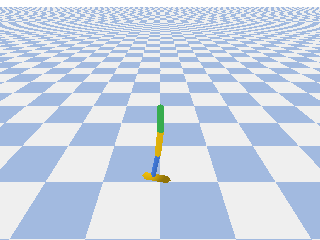

In [13]:
write_apng('anim.png',images,delay=20)
Image(filename='anim.png')